In [1]:
!pip install -q roboflow
!pip install -q ultralytics

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="")
project = rf.workspace("carsightv2").project("carsightv2")
version = project.version(4)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to CarSightv2-4 in yolov8:: 100%|██████████| 25638/25638 [00:04<00:00, 5492.87it/s] 


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
from ultralytics import YOLO
import yaml
import os
import shutil
from sklearn.model_selection import train_test_split
import torch

In [4]:
base_dir = '/kaggle/working/CarSightv2-4'
images_dir = os.path.join(base_dir, "train/images")
labels_dir = os.path.join(base_dir, "train/labels")
new_base_dir = os.path.join('', "dataset")

# Create the new directory structure
new_train_images_dir = os.path.join(new_base_dir, "train/images")
new_train_labels_dir = os.path.join(new_base_dir, "train/labels")
new_val_images_dir = os.path.join(new_base_dir, "valid/images")
new_val_labels_dir = os.path.join(new_base_dir, "valid/labels")
new_test_images_dir = os.path.join(new_base_dir, "test/images")
new_test_labels_dir = os.path.join(new_base_dir, "test/labels")

for path in [new_train_images_dir, new_train_labels_dir, new_val_images_dir, new_val_labels_dir, new_test_images_dir, new_test_labels_dir]:
    os.makedirs(path, exist_ok=True)

# Get all image and label files
image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg') or f.endswith('.png')]
label_files = [f.replace('.jpg', '.txt').replace('.png', '.txt') for f in image_files]

# Split into train, validation, and test sets (e.g., 70% train, 15% val, 15% test)
train_images, test_images, train_labels, test_labels = train_test_split(image_files, label_files, test_size=0.3, random_state=42)
val_images, test_images, val_labels, test_labels = train_test_split(test_images, test_labels, test_size=0.5, random_state=42)

# Function to copy files to the respective folders
def copy_files(file_list, src_dir, dest_dir):
    for file_name in file_list:
        src_path = os.path.join(src_dir, file_name)
        dest_path = os.path.join(dest_dir, file_name)
        if os.path.exists(src_path):
            shutil.copy(src_path, dest_path)

# Copy files for train set
copy_files(train_images, images_dir, new_train_images_dir)
copy_files(train_labels, labels_dir, new_train_labels_dir)

# Copy files for validation set
copy_files(val_images, images_dir, new_val_images_dir)
copy_files(val_labels, labels_dir, new_val_labels_dir)

# Copy files for test set
copy_files(test_images, images_dir, new_test_images_dir)
copy_files(test_labels, labels_dir, new_test_labels_dir)

print("Dataset split successfully.")

Dataset split successfully.


In [5]:
yaml_path = '/kaggle/working/CarSightv2-4/data.yaml'
new_paths = {
    'train': '/kaggle/working/dataset/train/images',
    'val': '/kaggle/working/dataset/valid/images',
    'test': '/kaggle/working/dataset/test/images'
}

with open(yaml_path, 'r') as file:
    data = yaml.safe_load(file)
data.update(new_paths)
with open(yaml_path, 'w') as file:
    yaml.dump(data, file)

print("Paths updated successfully.")

Paths updated successfully.


In [6]:
model = YOLO('yolov8s.yaml')

In [7]:
print("Number of GPUs: ",torch.cuda.device_count())
print("Number of CPU Cores",os.cpu_count())

cpu_cores = os.cpu_count()
workers = cpu_cores * 2

Number of GPUs:  2
Number of CPU Cores 4


In [8]:
result = model.train(
    data='/kaggle/input/carsight-yaml-data/data.yaml',  # Path to YAML file
    epochs=100,                                     # Number of epochs
    batch=32,                                       # Total batch size (distributed across GPUs)
    imgsz=640,                                      # Image size
    device='0,1',                                   # Specify the two GPUs (0 and 1)
    workers=workers,                                # Set the number of workers dynamically
    name='/kaggle/working/CarSight-v8',             # Experiment name
    patience=5
)

Ultralytics 8.3.35 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
                                                 CUDA:1 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.yaml, data=/kaggle/input/carsight-yaml-data/data.yaml, epochs=100, time=None, patience=5, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=0,1, workers=8, project=None, name=CarSight-v8, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, s

100%|██████████| 755k/755k [00:00<00:00, 17.6MB/s]
2024-11-21 16:17:09,016	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-11-21 16:17:10,466	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=255

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralyti

100%|██████████| 5.35M/5.35M [00:00<00:00, 71.7MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/dataset/train/labels... 8971 images, 0 backgrounds, 0 corrupt: 100%|██████████| 8971/8971 [00:08<00:00, 1118.96it/s]


train: New cache created: /kaggle/working/dataset/train/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 91, len(boxes) = 29483. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/working/dataset/valid/labels... 103 images, 0 backgrounds, 0 corrupt:   5%|▌         | 103/1922 [00:00<00:01, 1007.87it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/working/dataset/valid/labels... 1922 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1922/1922 [00:01<00:00, 1205.24it/s]


val: New cache created: /kaggle/working/dataset/valid/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 6, len(boxes) = 6366. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


Plotting labels to /kaggle/working/CarSight-v8/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /kaggle/working/CarSight-v8
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100       4.8G      3.276      6.162      4.133         42        640: 100%|██████████| 281/281 [01:47<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [02:22<00:00,  2.34s/it]


                   all       1922       6366   0.000244     0.0055   0.000271   5.45e-05

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100       4.7G      2.422      5.042      2.984         35        640: 100%|██████████| 281/281 [01:50<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.45it/s]


                   all       1922       6366      0.469     0.0176     0.0137     0.0063

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      4.67G      1.571      3.872      1.984         42        640: 100%|██████████| 281/281 [01:49<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:18<00:00,  3.32it/s]


                   all       1922       6366      0.375     0.0692     0.0368     0.0204

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      4.74G      1.304      3.357      1.613         37        640: 100%|██████████| 281/281 [01:48<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:18<00:00,  3.36it/s]


                   all       1922       6366      0.619      0.129      0.112     0.0695

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100       4.7G      1.192      2.968      1.478         46        640: 100%|██████████| 281/281 [01:48<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.39it/s]


                   all       1922       6366       0.59      0.183      0.195      0.123

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      4.71G      1.136      2.656      1.403         53        640: 100%|██████████| 281/281 [01:48<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.40it/s]


                   all       1922       6366      0.625      0.255      0.262      0.173

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100       4.7G      1.086       2.41      1.355         50        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.43it/s]


                   all       1922       6366      0.541      0.291      0.291      0.192

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      4.71G      1.051      2.215      1.323         43        640: 100%|██████████| 281/281 [01:48<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.39it/s]


                   all       1922       6366      0.608      0.354      0.379      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100       4.7G      1.032       2.01      1.298         46        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.41it/s]


                   all       1922       6366      0.648      0.398      0.441      0.305

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      4.73G      1.015      1.868      1.272         51        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.43it/s]


                   all       1922       6366       0.54      0.514      0.487       0.35

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      4.69G      0.989      1.726       1.25         46        640: 100%|██████████| 281/281 [01:48<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.44it/s]


                   all       1922       6366      0.622      0.513      0.536      0.386

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      4.74G     0.9717      1.617       1.23         27        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:18<00:00,  3.39it/s]


                   all       1922       6366      0.571       0.57      0.545      0.398

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100       4.7G     0.9588      1.529      1.219         41        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:18<00:00,  3.37it/s]


                   all       1922       6366      0.617      0.562      0.571      0.414

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      4.74G     0.9443      1.465      1.208         35        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.40it/s]


                   all       1922       6366      0.593      0.587      0.593      0.435

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      4.66G     0.9257      1.382      1.187         42        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.41it/s]


                   all       1922       6366      0.626      0.614      0.618      0.457

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      4.71G     0.9196      1.344      1.185         42        640: 100%|██████████| 281/281 [01:48<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.40it/s]


                   all       1922       6366      0.613      0.621       0.63      0.462

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      4.66G     0.9091      1.293      1.182         36        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.43it/s]


                   all       1922       6366      0.624      0.649      0.645      0.479

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      4.73G     0.9057      1.259      1.171         45        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.41it/s]


                   all       1922       6366      0.631      0.668      0.657       0.49

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100       4.7G     0.8915      1.209       1.17         42        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.40it/s]


                   all       1922       6366      0.616      0.688      0.677      0.508

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100       4.7G      0.886      1.194      1.159         41        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.41it/s]


                   all       1922       6366      0.618      0.697       0.68      0.514

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100       4.7G     0.8781      1.149      1.148         41        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.41it/s]


                   all       1922       6366      0.598      0.702      0.687      0.512

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100       4.7G     0.8708      1.125      1.153         43        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.41it/s]


                   all       1922       6366      0.716      0.684      0.707       0.54

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      4.69G     0.8601      1.091      1.137         42        640: 100%|██████████| 281/281 [01:48<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.41it/s]


                   all       1922       6366      0.658      0.711      0.716       0.55

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      4.71G     0.8489      1.075      1.137         45        640: 100%|██████████| 281/281 [01:48<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.43it/s]


                   all       1922       6366       0.67      0.738       0.73      0.563

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      4.66G     0.8402      1.067       1.13         37        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.44it/s]


                   all       1922       6366      0.684      0.726      0.728      0.558

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      4.75G     0.8394       1.05      1.127         37        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.42it/s]


                   all       1922       6366      0.702      0.705      0.746      0.577

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      4.69G     0.8376      1.024      1.126         48        640: 100%|██████████| 281/281 [01:48<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.40it/s]


                   all       1922       6366      0.694      0.736      0.753      0.587

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      4.71G      0.827     0.9954      1.119         38        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.42it/s]


                   all       1922       6366        0.7      0.728      0.749      0.585

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      4.66G     0.8264     0.9748      1.117         29        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:18<00:00,  3.38it/s]


                   all       1922       6366      0.687      0.734      0.759      0.593

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      4.74G     0.8197     0.9568      1.111         36        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.44it/s]


                   all       1922       6366      0.699      0.758      0.772      0.607

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      4.69G     0.8158     0.9507       1.11         33        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.39it/s]


                   all       1922       6366      0.739      0.741      0.775      0.612

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      4.75G     0.8118     0.9353      1.105         23        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.40it/s]


                   all       1922       6366        0.7      0.772      0.783      0.611

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      4.66G     0.8024      0.915      1.106         53        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:18<00:00,  3.37it/s]


                   all       1922       6366      0.682      0.794      0.778      0.612

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100       4.7G     0.7945     0.9037      1.102         47        640: 100%|██████████| 281/281 [01:48<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.43it/s]


                   all       1922       6366      0.708      0.782      0.782      0.617

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      4.69G     0.7935     0.8901      1.103         28        640: 100%|██████████| 281/281 [01:47<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.43it/s]


                   all       1922       6366      0.732      0.765      0.796      0.631

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      4.71G     0.7841     0.8644      1.092         38        640: 100%|██████████| 281/281 [01:48<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.44it/s]


                   all       1922       6366      0.743      0.768      0.798      0.629

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      4.66G     0.7864     0.8712      1.095         31        640: 100%|██████████| 281/281 [01:48<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.40it/s]


                   all       1922       6366       0.75      0.763       0.81      0.646

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      4.73G     0.7821     0.8487      1.091         30        640: 100%|██████████| 281/281 [01:48<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.41it/s]


                   all       1922       6366       0.74      0.797      0.818      0.651

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      4.69G     0.7767     0.8341      1.091         28        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:18<00:00,  3.38it/s]


                   all       1922       6366      0.743      0.794      0.818      0.656

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      4.75G      0.768     0.8306      1.086         22        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:18<00:00,  3.37it/s]


                   all       1922       6366      0.764      0.788      0.832      0.673

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100       4.7G     0.7687     0.8144      1.085         39        640: 100%|██████████| 281/281 [01:48<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:18<00:00,  3.38it/s]


                   all       1922       6366      0.742      0.792      0.824      0.663

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      4.74G     0.7688     0.8116      1.082         49        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.40it/s]


                   all       1922       6366      0.768      0.783       0.83      0.668

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      4.69G     0.7573     0.7899      1.081         41        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:18<00:00,  3.39it/s]


                   all       1922       6366      0.796      0.788       0.84      0.678

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      4.73G     0.7501     0.7858      1.073         45        640: 100%|██████████| 281/281 [01:48<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.40it/s]


                   all       1922       6366      0.768      0.813      0.844      0.686

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      4.66G     0.7436     0.7768      1.071         46        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:18<00:00,  3.37it/s]


                   all       1922       6366       0.77       0.81      0.849       0.69

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      4.73G     0.7472     0.7655      1.072         37        640: 100%|██████████| 281/281 [01:48<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.41it/s]


                   all       1922       6366      0.788      0.808      0.851      0.689

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      4.69G      0.744     0.7617      1.067         42        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.45it/s]


                   all       1922       6366      0.777      0.826      0.847      0.691

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100       4.7G     0.7402     0.7452      1.066         37        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:18<00:00,  3.39it/s]


                   all       1922       6366       0.79      0.804      0.854      0.695

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      4.66G     0.7355     0.7297      1.063         37        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.43it/s]


                   all       1922       6366       0.81      0.821      0.857        0.7

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100       4.7G     0.7307     0.7281      1.067         39        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.40it/s]


                   all       1922       6366      0.811      0.816      0.863      0.707

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      4.69G     0.7318     0.7275      1.065         32        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.42it/s]


                   all       1922       6366      0.817      0.817      0.868      0.711

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      4.71G     0.7215     0.7034      1.053         24        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.41it/s]


                   all       1922       6366      0.795      0.844      0.872      0.714

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      4.69G     0.7195     0.7068      1.054         49        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.42it/s]


                   all       1922       6366      0.825      0.828      0.873      0.721

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      4.73G      0.714     0.6952      1.054         46        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.42it/s]


                   all       1922       6366      0.803      0.847      0.879      0.726

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      4.66G     0.7142      0.683      1.046         42        640: 100%|██████████| 281/281 [01:49<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.42it/s]


                   all       1922       6366      0.806      0.862      0.886      0.731

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      4.73G     0.7119     0.6868      1.047         48        640: 100%|██████████| 281/281 [01:48<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.43it/s]


                   all       1922       6366      0.825      0.856      0.887      0.734

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      4.69G     0.7085     0.6766       1.05         36        640: 100%|██████████| 281/281 [01:48<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.41it/s]


                   all       1922       6366      0.843      0.854      0.891      0.738

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      4.73G     0.6995      0.667      1.043         29        640: 100%|██████████| 281/281 [01:48<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.44it/s]


                   all       1922       6366      0.857      0.826      0.893      0.739

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      4.69G     0.7019     0.6604      1.039         40        640: 100%|██████████| 281/281 [01:48<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.46it/s]


                   all       1922       6366      0.844      0.854      0.896      0.744

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      4.73G     0.6941     0.6523      1.041         45        640: 100%|██████████| 281/281 [01:48<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.42it/s]


                   all       1922       6366      0.852      0.851      0.899      0.749

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      4.69G     0.6828     0.6439      1.037         28        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.39it/s]


                   all       1922       6366      0.875      0.828      0.901      0.752

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      4.73G     0.6841     0.6446      1.036         27        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.41it/s]


                   all       1922       6366      0.838       0.86      0.907      0.753

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      4.66G     0.6828     0.6407      1.035         54        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.41it/s]


                   all       1922       6366      0.852      0.857      0.911      0.757

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      4.73G     0.6797     0.6256      1.033         35        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.39it/s]


                   all       1922       6366      0.885      0.844      0.911      0.761

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      4.66G     0.6786      0.628      1.031         41        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.42it/s]


                   all       1922       6366      0.862      0.858      0.908      0.755

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      4.75G     0.6706     0.6095      1.028         45        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.42it/s]


                   all       1922       6366      0.871       0.86      0.909      0.757

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      4.69G     0.6718     0.6088      1.031         22        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.41it/s]


                   all       1922       6366      0.879      0.861      0.913      0.763

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      4.74G     0.6639     0.5983      1.027         36        640: 100%|██████████| 281/281 [01:47<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.46it/s]


                   all       1922       6366      0.869      0.871      0.914      0.763

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      4.65G     0.6613     0.5875      1.023         30        640: 100%|██████████| 281/281 [01:47<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.45it/s]


                   all       1922       6366      0.857      0.879      0.915      0.766

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100       4.7G     0.6593     0.5797      1.025         28        640: 100%|██████████| 281/281 [01:48<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.42it/s]


                   all       1922       6366      0.892       0.86      0.918       0.77

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      4.69G     0.6538      0.569      1.018         35        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.42it/s]


                   all       1922       6366      0.879      0.871      0.919       0.77

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      4.73G     0.6532     0.5759      1.019         36        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.42it/s]


                   all       1922       6366      0.896       0.86      0.923      0.774

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      4.66G     0.6485     0.5598      1.016         46        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.43it/s]


                   all       1922       6366      0.888      0.867      0.921      0.773

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      4.73G     0.6395     0.5601      1.017         39        640: 100%|██████████| 281/281 [01:48<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.43it/s]


                   all       1922       6366      0.882      0.876      0.923      0.775

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      4.69G     0.6408     0.5544      1.011         34        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.47it/s]


                   all       1922       6366      0.888      0.873      0.924      0.777

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      4.71G      0.636     0.5503      1.011         26        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.47it/s]


                   all       1922       6366        0.9      0.871      0.926      0.777

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      4.69G     0.6339     0.5433      1.011         33        640: 100%|██████████| 281/281 [01:48<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.44it/s]


                   all       1922       6366      0.895      0.875      0.927      0.779

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100       4.7G     0.6345     0.5398       1.01         26        640: 100%|██████████| 281/281 [01:48<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.44it/s]


                   all       1922       6366      0.901      0.875       0.93      0.783

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100       4.7G      0.624     0.5296      1.004         36        640: 100%|██████████| 281/281 [01:48<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.45it/s]


                   all       1922       6366      0.899       0.88      0.932      0.785

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      4.74G     0.6279     0.5211      1.006         47        640: 100%|██████████| 281/281 [01:48<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.44it/s]


                   all       1922       6366      0.901      0.877      0.932      0.786

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      4.66G     0.6189     0.5185      1.001         51        640: 100%|██████████| 281/281 [01:48<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.44it/s]


                   all       1922       6366      0.872      0.904      0.931      0.785

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100       4.7G     0.6128     0.5173      1.001         21        640: 100%|██████████| 281/281 [01:48<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.44it/s]


                   all       1922       6366      0.882      0.899      0.933      0.786

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      4.69G     0.6124     0.5142     0.9968         42        640: 100%|██████████| 281/281 [01:48<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.42it/s]


                   all       1922       6366      0.888      0.893      0.933      0.788

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100       4.7G     0.6064     0.5131     0.9998         40        640: 100%|██████████| 281/281 [01:48<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.42it/s]


                   all       1922       6366      0.893      0.895      0.935      0.789

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      4.66G     0.6036     0.5106     0.9977         35        640: 100%|██████████| 281/281 [01:48<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.41it/s]


                   all       1922       6366      0.899      0.893      0.936       0.79

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      4.71G     0.6022     0.5005     0.9961         52        640: 100%|██████████| 281/281 [01:48<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.44it/s]


                   all       1922       6366      0.902      0.887      0.936      0.791

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      4.69G      0.597      0.485     0.9891         32        640: 100%|██████████| 281/281 [01:48<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.43it/s]


                   all       1922       6366      0.905      0.891      0.936      0.791

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      4.73G      0.595     0.4869     0.9898         27        640: 100%|██████████| 281/281 [01:48<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.45it/s]


                   all       1922       6366      0.902      0.893      0.937      0.791

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      4.66G     0.5933     0.4855     0.9885         35        640: 100%|██████████| 281/281 [01:48<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.42it/s]


                   all       1922       6366        0.9      0.897      0.937      0.793

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      4.73G     0.5851     0.4765      0.984         35        640: 100%|██████████| 281/281 [01:48<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.45it/s]


                   all       1922       6366      0.895      0.905      0.939      0.794
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      4.66G     0.5952     0.3513     0.9763         19        640: 100%|██████████| 281/281 [01:47<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.39it/s]


                   all       1922       6366      0.905        0.9       0.94      0.794

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100       4.7G     0.5831     0.3398     0.9675         19        640: 100%|██████████| 281/281 [01:46<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.41it/s]


                   all       1922       6366      0.909      0.899      0.941      0.795

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      4.66G      0.577     0.3329     0.9599         23        640: 100%|██████████| 281/281 [01:46<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.46it/s]


                   all       1922       6366      0.909      0.898      0.942      0.797

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100       4.7G      0.568     0.3289     0.9593         21        640: 100%|██████████| 281/281 [01:46<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.43it/s]


                   all       1922       6366      0.907        0.9      0.942      0.798

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      4.66G     0.5596     0.3213      0.954         21        640: 100%|██████████| 281/281 [01:47<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.44it/s]


                   all       1922       6366      0.905      0.904      0.943      0.799

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100       4.7G     0.5567     0.3183     0.9506         18        640: 100%|██████████| 281/281 [01:46<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.45it/s]


                   all       1922       6366      0.906      0.904      0.943        0.8

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      4.65G     0.5497     0.3147     0.9452         17        640: 100%|██████████| 281/281 [01:46<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.43it/s]


                   all       1922       6366      0.907      0.906      0.944        0.8

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100       4.7G     0.5455      0.316     0.9478         21        640: 100%|██████████| 281/281 [01:47<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.47it/s]


                   all       1922       6366      0.906      0.909      0.945      0.802

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      4.66G     0.5393     0.3098     0.9422         14        640: 100%|██████████| 281/281 [01:47<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.42it/s]


                   all       1922       6366      0.906      0.908      0.944      0.803

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100       4.7G     0.5378     0.3095     0.9441         25        640: 100%|██████████| 281/281 [01:46<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:18<00:00,  3.37it/s]


                   all       1922       6366      0.907      0.906      0.945      0.802

100 epochs completed in 3.571 hours.
Optimizer stripped from /kaggle/working/CarSight-v8/weights/last.pt, 22.7MB
Optimizer stripped from /kaggle/working/CarSight-v8/weights/best.pt, 22.7MB

Validating /kaggle/working/CarSight-v8/weights/best.pt...
WARNING ⚠️ validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.35 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
                                                 CUDA:1 (Tesla T4, 15095MiB)
YOLOv8s summary (fused): 168 layers, 11,224,269 parameters, 0 gradients, 29.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:17<00:00,  3.53it/s]


                   all       1922       6366      0.906      0.908      0.944      0.803
       1.3-dlx_variant          4          4      0.831       0.75      0.945      0.613
       1.5-CVT_variant          1          1      0.696          1      0.995      0.796
        1.5-MT_variant          2          2          1          0      0.995      0.574
        1.6-SR_variant          2          2          1      0.902      0.995      0.589
          1.6T_variant         16         16      0.974          1      0.995       0.72
          1.6X_variant         10         10      0.686      0.876      0.742      0.524
           1.6_variant          2          2      0.884          1      0.995      0.597
          1.8X_variant          5          5      0.917        0.2      0.462      0.323
           1.8_variant          1          1      0.798          1      0.995      0.796
      2.7-VVTi_variant          5          5       0.92        0.8      0.866      0.481
           2.5_varian


image 1/1 /kaggle/working/dataset/test/images/united_bravo_2019-2023_base_aug_47_jpg.rf.41b7d3fa67bada50c9271dd8187b927a.jpg: 640x640 1 bravo_model, 1 united_bravo_base_2019-2023, 16.9ms
Speed: 2.7ms preprocess, 16.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /kaggle/working/predictions/predict24
1 label saved to /kaggle/working/predictions/predict24/labels


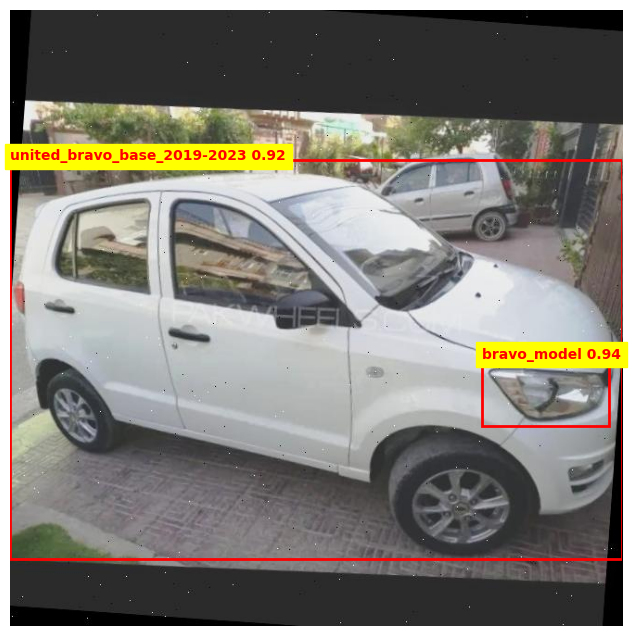


image 1/1 /kaggle/working/dataset/test/images/peugeot_2008_2021-2023_active_aug_34_jpg.rf.4c96579550601b4b96c7c8fab87b9a02.jpg: 512x640 1 2008_model, 1 peugeot_2008_active-allure_2021-2023, 1 peugeot_badge, 1 peugeot_logo, 14.3ms
Speed: 2.5ms preprocess, 14.3ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 640)
Results saved to /kaggle/working/predictions/predict25
1 label saved to /kaggle/working/predictions/predict25/labels


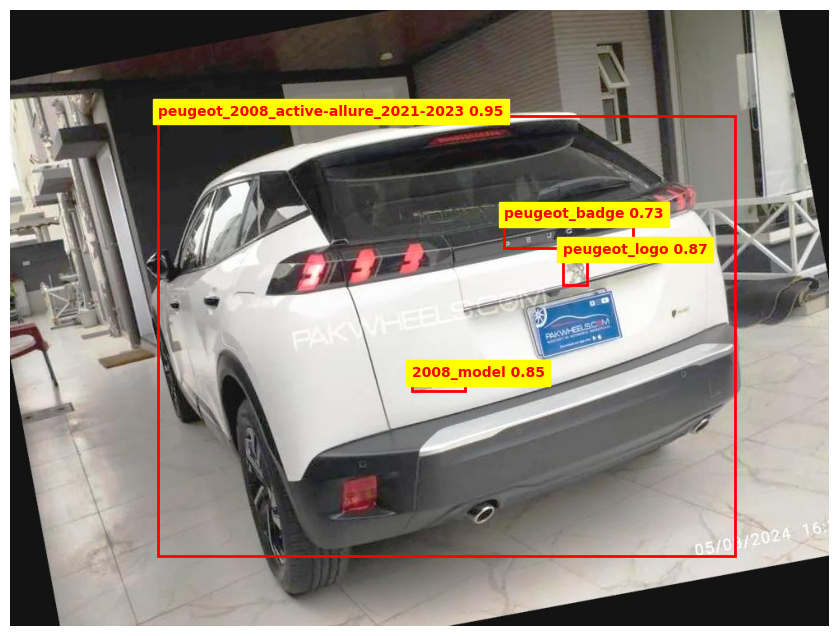


image 1/1 /kaggle/working/dataset/test/images/peugeot_e-2008_2022-2023_gt_aug_89_jpg.rf.cceaa8b603fce4c0437315d7794d0ba4.jpg: 480x640 1 e2008_model, 1 gt_variant, 1 peugeot_badge, 1 peugeot_e2008_gt_2022-2023, 1 peugeot_logo, 14.5ms
Speed: 3.5ms preprocess, 14.5ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /kaggle/working/predictions/predict26
1 label saved to /kaggle/working/predictions/predict26/labels


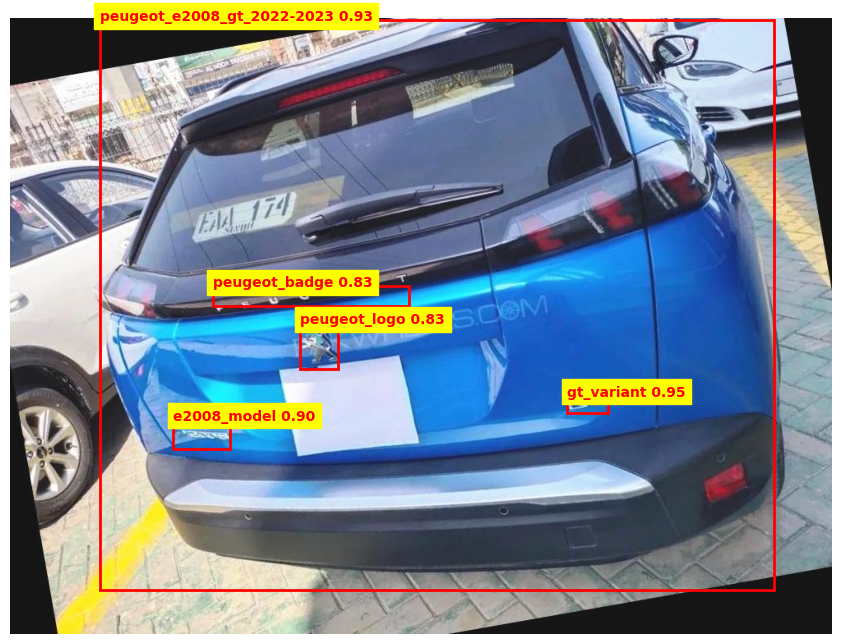


image 1/1 /kaggle/working/dataset/test/images/Honda_Civic_1-8_i-VTEC_CVT_2016_1_jpeg.rf.728e168ecbe61be7c4b1853508eeff69.jpg: 640x480 2 civic_models, 1 honda_civic_i-vtec_2016-2021, 1 honda_logo, 13.6ms
Speed: 3.2ms preprocess, 13.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)
Results saved to /kaggle/working/predictions/predict27
1 label saved to /kaggle/working/predictions/predict27/labels


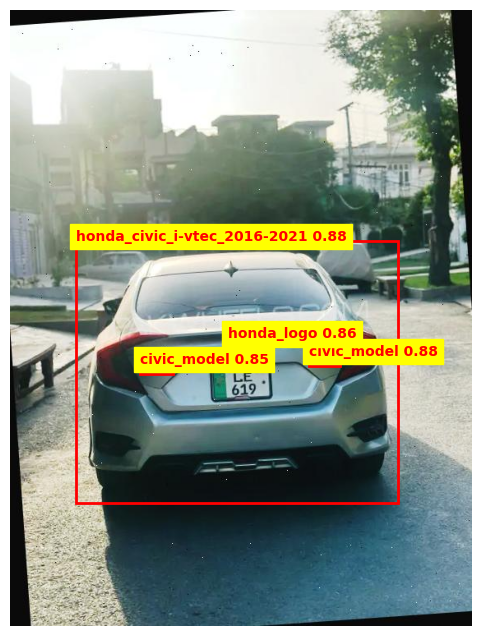


image 1/1 /kaggle/working/dataset/test/images/hyundai_santa_fe_2021-2023_smart_aug_26_jpg.rf.f1a7f8b2d5ea9dce90cab72f8b556ca3.jpg: 480x640 1 hyundai_logo, 1 hyundai_santafe_smart_2021-2023, 1 santafe_model, 14.4ms
Speed: 2.4ms preprocess, 14.4ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /kaggle/working/predictions/predict28
1 label saved to /kaggle/working/predictions/predict28/labels


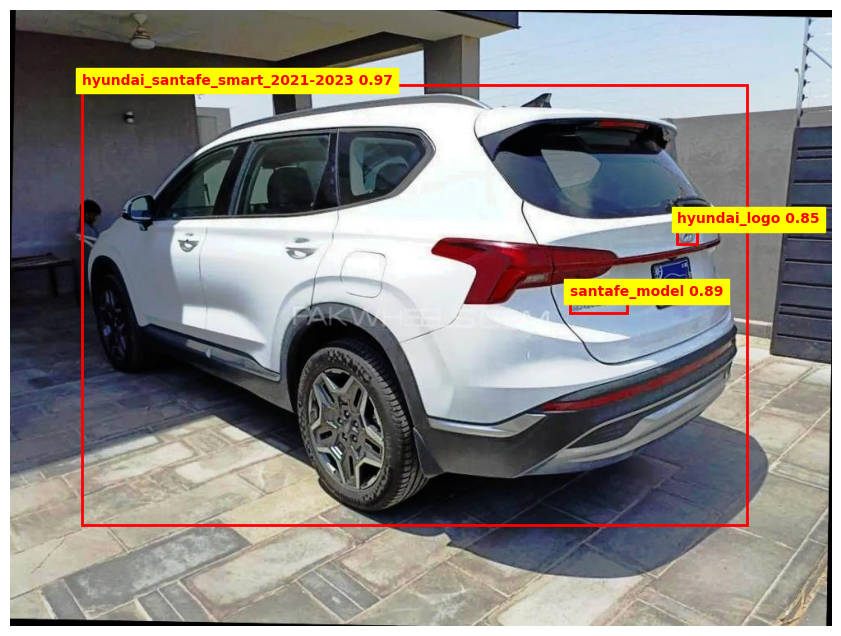


image 1/1 /kaggle/working/dataset/test/images/KIA_Sorento_2-4_FWD_2021_1_jpg.rf.4d679a890da72fa82b210d97333815c6.jpg: 480x640 1 kia_logo, 1 kia_sorento_fwd_2021-2023, 2 sorento_models, 13.7ms
Speed: 3.4ms preprocess, 13.7ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /kaggle/working/predictions/predict29
1 label saved to /kaggle/working/predictions/predict29/labels


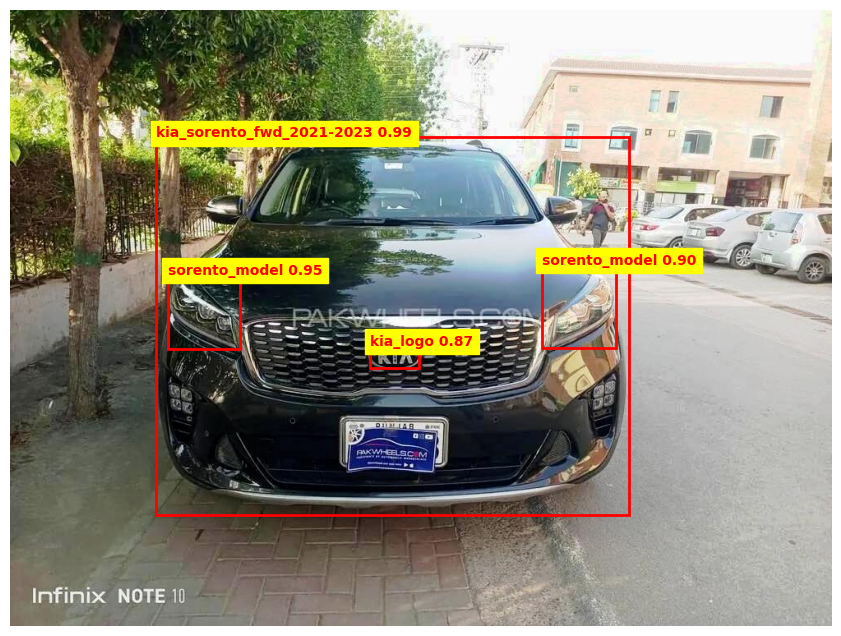


image 1/1 /kaggle/working/dataset/test/images/Honda_HR-V_VTi_2022_9_jpeg.rf.008612e6a9d8c50065eed3ea782d24cc.jpg: 480x640 1 honda_hr-v_s_2022-2023, 1 honda_logo, 1 hr-v_model, 13.6ms
Speed: 2.2ms preprocess, 13.6ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /kaggle/working/predictions/predict30
1 label saved to /kaggle/working/predictions/predict30/labels


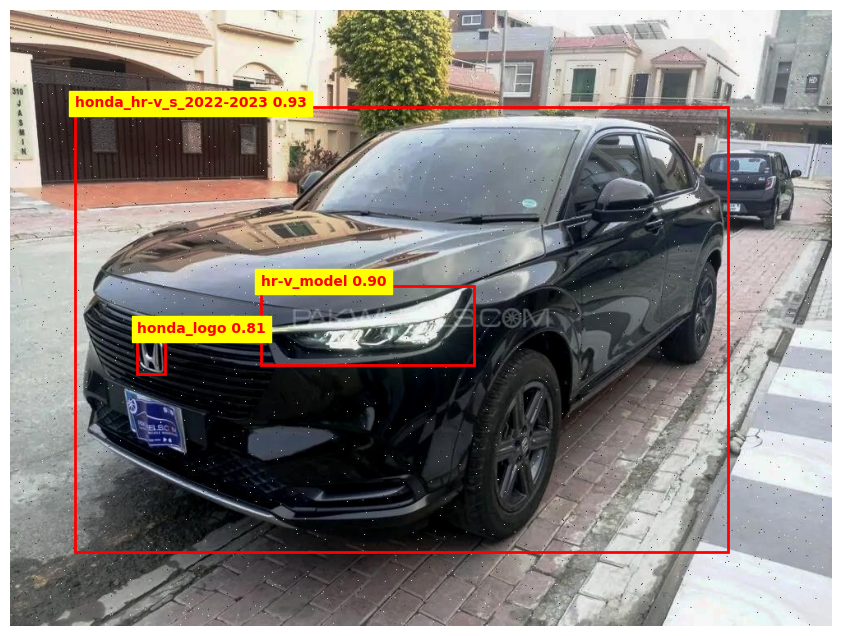


image 1/1 /kaggle/working/dataset/test/images/Honda_City_1-2L_CVT_2021_3_jpeg.rf.95250c8f9f47a528ef805249def74638.jpg: 640x480 2 city_models, 1 honda_city_1.2-CVT_2021-2023, 1 honda_logo, 13.3ms
Speed: 2.1ms preprocess, 13.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)
Results saved to /kaggle/working/predictions/predict31
1 label saved to /kaggle/working/predictions/predict31/labels


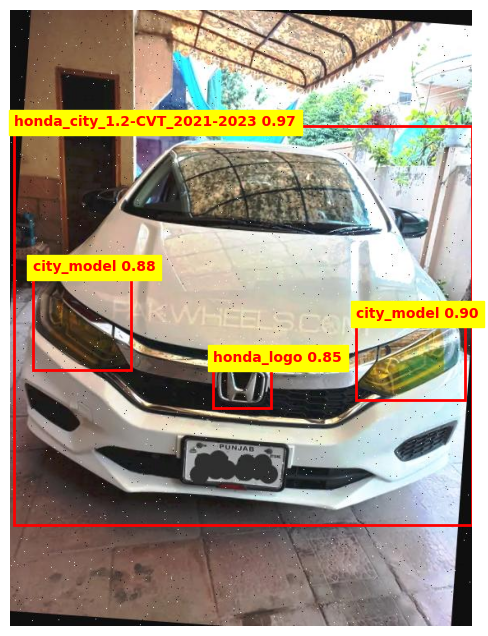


image 1/1 /kaggle/working/dataset/test/images/Toyota_Fortuner_2-7_G_2022_10_jpeg.rf.44a6edbe81c75eaeb18367ffee2c77d6.jpg: 512x640 2 2.7-G_variants, 1 fortuner_model, 1 toyota_fortuner_2.7-G_2017-2023, 1 toyota_logo, 14.4ms
Speed: 2.5ms preprocess, 14.4ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 640)
Results saved to /kaggle/working/predictions/predict32
1 label saved to /kaggle/working/predictions/predict32/labels


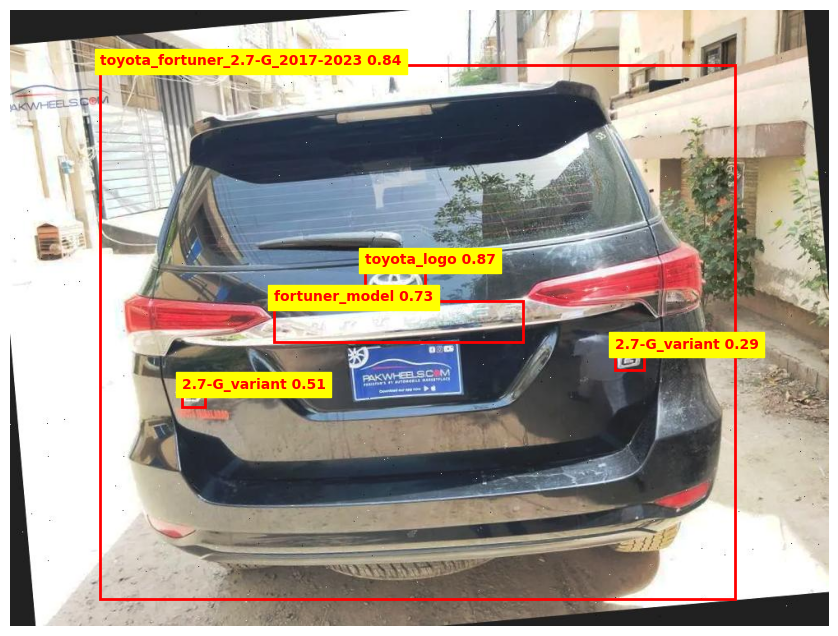


image 1/1 /kaggle/working/dataset/test/images/Honda_BR-V_i-VTEC_MT_2018_2_jpeg.rf.77fd50f25622416fce796d32687eaf0d.jpg: 480x640 1 br-v_model, 1 honda_br-v_MT_2017-2023, 1 honda_logo, 14.4ms
Speed: 2.2ms preprocess, 14.4ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /kaggle/working/predictions/predict33
1 label saved to /kaggle/working/predictions/predict33/labels


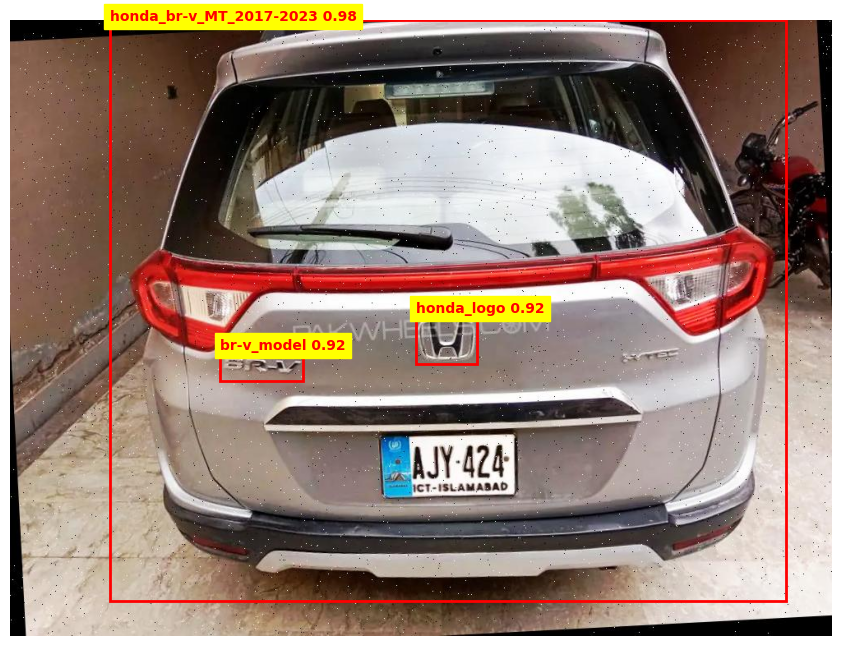


image 1/1 /kaggle/working/dataset/test/images/Suzuki_Mehran_VXR_Euro_II_2018_22_jpeg.rf.464c7802d818954c714149da0364e68a.jpg: 640x480 1 mehran_model, 1 suzuki_mehran_vxr_2013-2019, 1 vxr_variant, 13.4ms
Speed: 2.3ms preprocess, 13.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)
Results saved to /kaggle/working/predictions/predict34
1 label saved to /kaggle/working/predictions/predict34/labels


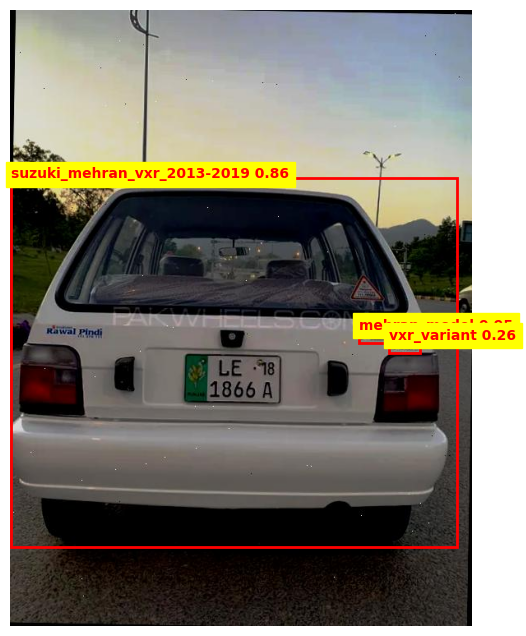


image 1/1 /kaggle/working/dataset/test/images/chery_tiggo4pro_2022-2023_1-5t_aug_97_jpg.rf.6d5f3e3156fa48c88b1e82bd2d2e7969.jpg: 480x640 1 chery_badge, 1 chery_logo, 1 chery_tiggo-4-pro_1.5T_2022-2023, 1 tiggo-4-pro_model, 14.4ms
Speed: 2.4ms preprocess, 14.4ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /kaggle/working/predictions/predict35
1 label saved to /kaggle/working/predictions/predict35/labels


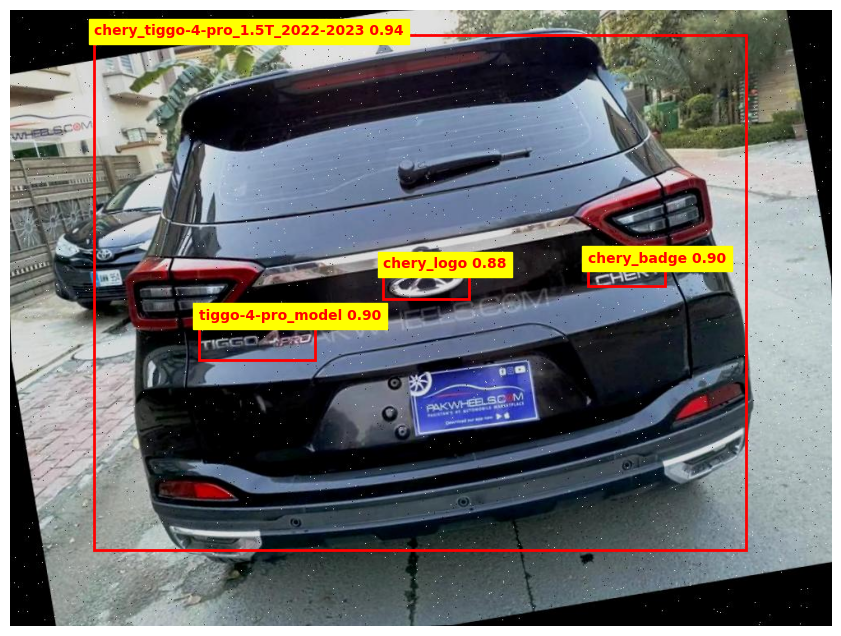


image 1/1 /kaggle/working/dataset/test/images/Honda_City_Aspire_1-3_i-VTEC_2015_5_jpeg.rf.6e36f209bc3cbf71c28dd1ec48e89b2d.jpg: 640x512 2 city_models, 1 honda_city_aspire_2013-2021, 1 honda_logo, 14.2ms
Speed: 3.2ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 512)
Results saved to /kaggle/working/predictions/predict36
1 label saved to /kaggle/working/predictions/predict36/labels


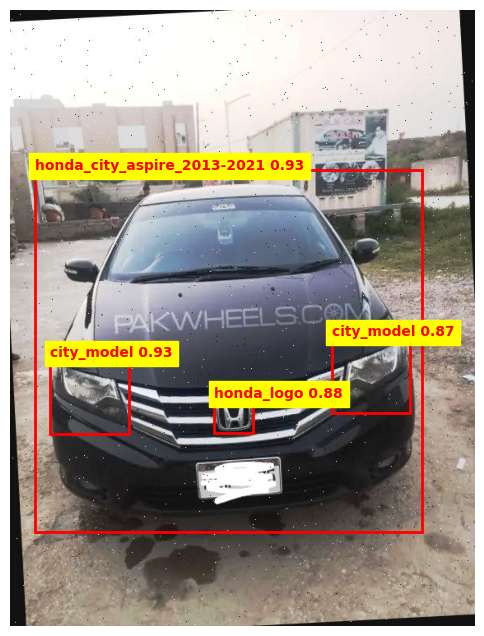


image 1/1 /kaggle/working/dataset/test/images/kia_stonic_2021-2023_ex-_aug_81_jpg.rf.5eecd0ac00eb01269b35546dc119090a.jpg: 640x480 1 kia_logo, 1 kia_stonic_ex_2021-2023, 2 stonic_models, 13.4ms
Speed: 2.1ms preprocess, 13.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)
Results saved to /kaggle/working/predictions/predict37
1 label saved to /kaggle/working/predictions/predict37/labels


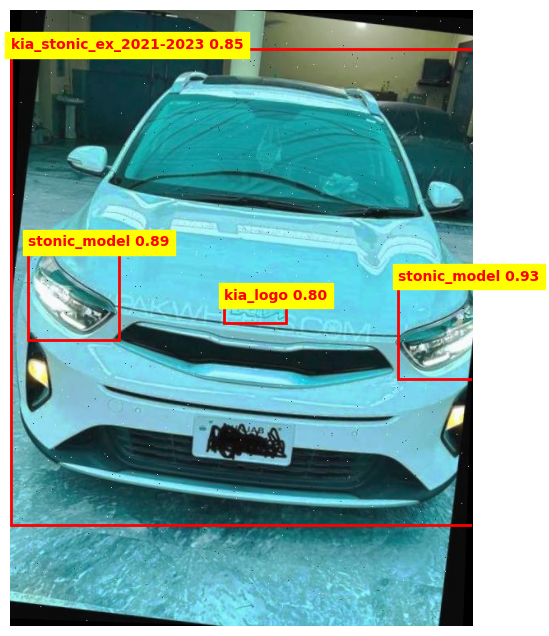


image 1/1 /kaggle/working/dataset/test/images/Suzuki_Bolan_Cargo_Van_Euro_ll_2016_4_jpeg.rf.01257f6922b1200f16ce042e553836b7.jpg: 640x288 2 bolan_models, 1 suzuki_bolan_euro-2_2013-2023, 1 suzuki_logo, 43.7ms
Speed: 1.4ms preprocess, 43.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 288)
Results saved to /kaggle/working/predictions/predict38
1 label saved to /kaggle/working/predictions/predict38/labels


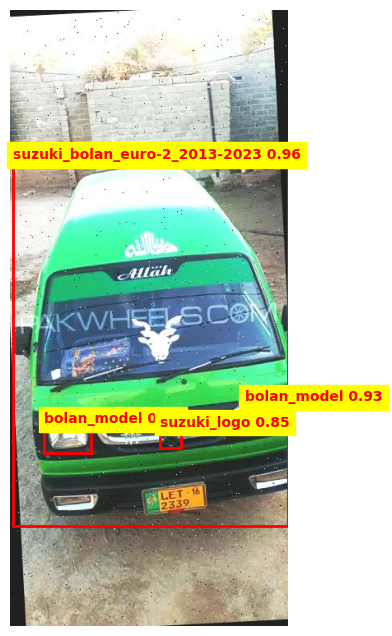


image 1/1 /kaggle/working/dataset/test/images/Prince_Pearl_MT_2020_8_jpg.rf.b723eacd320ab66a041c6de6f3918b0f.jpg: 640x480 2 pearl_models, 1 prince_logo, 1 prince_pearl_manual_2019-2023, 13.8ms
Speed: 3.9ms preprocess, 13.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)
Results saved to /kaggle/working/predictions/predict39
1 label saved to /kaggle/working/predictions/predict39/labels


In [ ]:
import cv2
import matplotlib.pyplot as plt
import random

folder = '/kaggle/working/dataset/test/images'
all_files = [os.path.join(folder, f) for f in os.listdir(folder) if os.path.isfile(os.path.join(folder, f))]
selected = random.sample(all_files, 20)

def plot(img_path, boxes, class_names):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(img)

    for box in boxes:
        x1, y1, x2, y2, confidence, class_id = box
        ax.add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='r', facecolor='none'))
        ax.text(x1, y1, f'{class_names[int(class_id)]} {confidence:.2f}', color='r', fontsize=10, weight='bold', backgroundcolor='yellow')

    plt.axis('off')
    plt.show()

model = YOLO('/kaggle/working/CarSight-v8/weights/best.pt')
class_names = model.names

for img in selected:
    pred = model.predict(img, save=True, save_txt=True, save_conf=True, project='/kaggle/working/predictions/')
    boxes = pred[0].boxes.data.cpu().numpy()
    plot(img, boxes, class_names)

In [13]:
shutil.make_archive('/kaggle/working/CarSight-v8', 'zip', '/kaggle/working/CarSight-v8')

'/kaggle/working/CarSight-v8.zip'

In [15]:
shutil.make_archive('/kaggle/working/test_results', 'zip', '/kaggle/working/test_results')

'/kaggle/working/test_results.zip'